In [393]:
%load_ext autoreload
%autoreload 2


from ff_energy.ffe.slurm import SlurmJobHandler
from pathlib import Path
import pandas as pd
import jax.numpy as jnp
import itertools as it
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import patchworklib as pw


from ff_energy.ffe.potential import (
    LJ,
    DE,
)

from ff_energy.ffe.ff import FF
from ff_energy.ffe.constants import FFEPATH
from ff_energy.plotting.ffe_plots import plot_energy_MSE, plot_ff_fit

from ff_energy.plotting.plotting import set_style, patchwork_grid, save_fig


from ff_energy.plotting.fit_results import (
    residuals_plot, simple_residuals_plot, residuals_from_keys
)

from ff_energy.logs.logging import hide_logs

from ff_energy.ffe.potential import LJ, LJ_bound, DE


hide_logs()


import scienceplots
set_style(no_latex=True)

# sns.set_style()
# plt.style.use(["science", "no-latex"])


from ff_energy.ffe.ff_fit import (
    load_ff,
    fit_func,
    fit_repeat,
)

from ff_energy.utils.ffe_utils import pickle_output, read_from_pickle, str2int, PKL_PATH
from ff_energy.utils.json_utils import load_json

from ff_energy.ffe.structure import atom_key_pairs


structure_data = {
    "dcm": "",
    "water_cluster": PKL_PATH / "20230823_water_clusters.pkl.pkl",
}

intE_label = "PBE0 Energy [kcal/mol]"
FFintE_label = "FF Energy [kcal/mol]"

import matplotlib.pyplot as mpl

mpl.rcParams['text.latex.preamble'] = [
       r'\usepackage{siunitx}',   # i need upright \micro symbols, but you need...
       r'\sisetup{detect-all}',   # ...this to force siunitx to actually use your fonts
       r'\usepackage{helvet}',    # set the normal font here
       r'\usepackage{sansmath}',  # load up the sansmath so that math -> helvet
       r'\sansmath'               # <- tricky! -- gotta actually tell tex to use!
]  

import pylab as plt
params = {'text.usetex': False, 'mathtext.fontset': 'stixsans'}
plt.rcParams.update(params)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# R

In [187]:
exclusions = ["null"]
intE_label = "PBE0 Energy [kcal/mol]"
FFintE_label = "FF Energy [kcal/mol]"

elec_label_keys = {
    'ELECci': "Coloumb",
    'ELECp': "PC Fit",
    'ELECm': "MDCM",
    'ELECk': "kMDCM",
    'ELECnull': "No electrostatics",
    'ELECnullpol': "Only Many-Body Polarization",
    'ELECpol': "Polarization",
    'ELECci': "Coloumb Integral",
    'ELECppol': "PC Fit + Polarization",
    'ELECmpol': "MDCM + Polarization",
    'ELECkpol': "kMDCM + Polarization",
    'ELECt': "TIP3P PC",
    'ELECtpol': "TIP3P PC + Polarization",
}

csv_files = list(PKL_PATH.glob("*elec.csv"))
dataframes = {csv.name: pd.read_csv(csv) for csv in csv_files}
names = [_.name for _ in csv_files if True not in [ex in _.name for ex in exclusions]]
names.sort()
dataframes = {n: dataframes[n] for n in names}
newnames = [elec_label_keys[_.split("_")[0]] for _ in names]

In [188]:
names

['ELECci_dcm_de_intE_elec.csv',
 'ELECci_dcm_lj_elec.csv',
 'ELECci_ions_ext_de_intE_elec.csv',
 'ELECci_ions_ext_lj_intE_elec.csv',
 'ELECci_water_cluster_de_intE_elec.csv',
 'ELECci_water_cluster_lj_MMintE_elec.csv',
 'ELECci_water_cluster_lj_elec.csv',
 'ELECci_water_cluster_lj_intE_elec.csv',
 'ELECk_water_cluster_lj_MMintE_elec.csv',
 'ELECk_water_cluster_lj_elec.csv',
 'ELECk_water_cluster_lj_intE_elec.csv',
 'ELECkpol_water_cluster_lj_MMintE_elec.csv',
 'ELECkpol_water_cluster_lj_elec.csv',
 'ELECkpol_water_cluster_lj_intE_elec.csv',
 'ELECm_dcm_de_intE_elec.csv',
 'ELECm_dcm_lj_elec.csv',
 'ELECm_ions_ext_de_intE_elec.csv',
 'ELECm_ions_ext_lj_intE_elec.csv',
 'ELECm_water_cluster_de_intE_elec.csv',
 'ELECm_water_cluster_lj_MMintE_elec.csv',
 'ELECm_water_cluster_lj_elec.csv',
 'ELECmpol_dcm_de_intE_elec.csv',
 'ELECmpol_dcm_lj_elec.csv',
 'ELECmpol_ions_ext_de_intE_elec.csv',
 'ELECmpol_ions_ext_lj_intE_elec.csv',
 'ELECmpol_water_cluster_de_intE_elec.csv',
 'ELECmpol_water_cl

In [189]:
new_dfs = []
new_keys = []
remove_keys = []


for k, d in dataframes.items():
    if k.__contains__("_ions_"):
        # print(d.keys())
        dfclids = [True if "CLA" in _ else False for _ in d["KEY"]]
        cl_ = d[dfclids]
        dfkids = [True if not "CLA" in _ else False for _ in d["KEY"]]
        k_ = d[dfkids]
        
        remove_keys.append(k)
        new_dfs.append(cl_)
        new_dfs.append(k_)
        new_keys.append(k+"_CLA")
        new_keys.append(k+"_POT")
        
# for rk in remove_keys:
#     dataframes.pop(rk)
    
for a,b in zip(new_dfs, new_keys):
    print(b)
    dataframes[b] = a
    
dataframes
    
   


ELECci_ions_ext_de_intE_elec.csv_CLA
ELECci_ions_ext_de_intE_elec.csv_POT
ELECci_ions_ext_lj_intE_elec.csv_CLA
ELECci_ions_ext_lj_intE_elec.csv_POT
ELECm_ions_ext_de_intE_elec.csv_CLA
ELECm_ions_ext_de_intE_elec.csv_POT
ELECm_ions_ext_lj_intE_elec.csv_CLA
ELECm_ions_ext_lj_intE_elec.csv_POT
ELECmpol_ions_ext_de_intE_elec.csv_CLA
ELECmpol_ions_ext_de_intE_elec.csv_POT
ELECmpol_ions_ext_lj_intE_elec.csv_CLA
ELECmpol_ions_ext_lj_intE_elec.csv_POT
ELECp_ions_ext_lj_intE_elec.csv_CLA
ELECp_ions_ext_lj_intE_elec.csv_POT
ELECpol_ions_ext_de_intE_elec.csv_CLA
ELECpol_ions_ext_de_intE_elec.csv_POT
ELECpol_ions_ext_lj_intE_elec.csv_CLA
ELECpol_ions_ext_lj_intE_elec.csv_POT
ELECppol_ions_ext_lj_intE_elec.csv_CLA
ELECppol_ions_ext_lj_intE_elec.csv_POT
ELECt_ions_ext_lj_intE_elec.csv_CLA
ELECt_ions_ext_lj_intE_elec.csv_POT
ELECtpol_ions_ext_lj_intE_elec.csv_CLA
ELECtpol_ions_ext_lj_intE_elec.csv_POT


{'ELECci_dcm_de_intE_elec.csv':                Unnamed: 0     target  residuals       vals
 0    100_1018_DCM_120_967 -12.411790   0.137778 -12.549568
 1    100_1019_DCM_120_565 -14.488511   0.349181 -14.837692
 2    100_1024_DCM_121_932 -14.360149  -4.673295  -9.686854
 3    100_1053_DCM_123_948 -11.071544   4.064075 -15.135618
 4     100_1100_DCM_129_15 -13.342866   5.320046 -18.662912
 ..                    ...        ...        ...        ...
 195   100_979_DCM_115_117 -12.412769  -5.244456  -7.168312
 196    100_983_DCM_116_25 -10.280112   6.839452 -17.119564
 197   100_986_DCM_116_989 -12.106152   1.326140 -13.432292
 198     100_98_DCM_12_534 -16.552713   0.067034 -16.619747
 199   100_992_DCM_117_761 -14.647476   1.447794 -16.095270
 
 [200 rows x 4 columns],
 'ELECci_dcm_lj_elec.csv':                Unnamed: 0     target  residuals       vals
 0    100_1018_DCM_120_967 -12.411790  -2.109342 -10.302447
 1    100_1019_DCM_120_565 -14.488511   1.448150 -15.936661
 2    100_1024_D

In [190]:
dataframes.keys()

dict_keys(['ELECci_dcm_de_intE_elec.csv', 'ELECci_dcm_lj_elec.csv', 'ELECci_ions_ext_de_intE_elec.csv', 'ELECci_ions_ext_lj_intE_elec.csv', 'ELECci_water_cluster_de_intE_elec.csv', 'ELECci_water_cluster_lj_MMintE_elec.csv', 'ELECci_water_cluster_lj_elec.csv', 'ELECci_water_cluster_lj_intE_elec.csv', 'ELECk_water_cluster_lj_MMintE_elec.csv', 'ELECk_water_cluster_lj_elec.csv', 'ELECk_water_cluster_lj_intE_elec.csv', 'ELECkpol_water_cluster_lj_MMintE_elec.csv', 'ELECkpol_water_cluster_lj_elec.csv', 'ELECkpol_water_cluster_lj_intE_elec.csv', 'ELECm_dcm_de_intE_elec.csv', 'ELECm_dcm_lj_elec.csv', 'ELECm_ions_ext_de_intE_elec.csv', 'ELECm_ions_ext_lj_intE_elec.csv', 'ELECm_water_cluster_de_intE_elec.csv', 'ELECm_water_cluster_lj_MMintE_elec.csv', 'ELECm_water_cluster_lj_elec.csv', 'ELECmpol_dcm_de_intE_elec.csv', 'ELECmpol_dcm_lj_elec.csv', 'ELECmpol_ions_ext_de_intE_elec.csv', 'ELECmpol_ions_ext_lj_intE_elec.csv', 'ELECmpol_water_cluster_de_intE_elec.csv', 'ELECmpol_water_cluster_lj_MMintE_

In [191]:
from sklearn.metrics import mean_squared_error as calc_rmse
from sklearn.metrics import mean_absolute_percentage_error as calc_mape
import scipy 

def stats(key):
    targets = dataframes[key]["target"]
    values = dataframes[key]["vals"]
    
    res=dataframes[key]["residuals"]
    rmseb = np.sqrt(calc_rmse(targets, values))
    MAE = np.mean(abs(targets - values))

    slopeb, interceptb, r_valueb, p_valueb, std_errb = scipy.stats.linregress(
    targets, values)
    
    values_dict = {}
    
    values_dict["eleckey"] = key.split("_")[0]
    values_dict["system"] = key.split("_")[1] if not "ions" in key.split("_")[1] else key.split("_")[-1]
    values_dict["internal"] = "MM" if "MMintE" in key else "exact"
    values_dict["Energy"] = "$E_{LJ}$" if "targets" in key.split("_")[3][:-4] else "$E_{int}$"
    values_dict["label"] = elec_label_keys[key.split("_")[0]]
    values_dict["RMSE"] = rmseb
    values_dict["NRMSE"] = abs(rmseb / (targets.quantile(0.25) - targets.quantile(0.5)))
    values_dict["$m$"] = slopeb
    values_dict["$c$"] = interceptb
    values_dict["$\sigma_{\delta}$"] = np.std(res)
    values_dict["MAPE"] = calc_mape(targets, values)
    values_dict["$r^{2}$"] = r_valueb**2
    values_dict["$1 - r^{2}$"] = 1 - r_valueb**2
    values_dict["ff"] = "de" if "_de_" in key else "lj"

    
    return values_dict

def make_pretty(styler):
    # styler.set_caption("Weather Conditions")
    styler.format('{:.1f}')
    # styler.format_index(lambda v: v.strftime("%A"))
    styler.background_gradient(axis=0, cmap="viridis")
    return styler

def make_pretty2(styler):
    # styler.set_caption("Weather Conditions")
    styler.format('{:.1f}')
    # styler.format_index(lambda v: v.strftime("%A"))
    # styler.background_gradient(axis=0, cmap="viridis")
    return styler

In [192]:
sdf = pd.DataFrame({k: stats(k) 
                    for k in dataframes.keys() 
                    if "Ck_" not in k and "Ct_" not in k and "res" not in k and "QMMint" not in k}).T

print(sdf.keys())
# sdf[sdf["eleckey"] == "ELECci"]
# _sdf = sdf[sdf["Energy"] == "$E_{LJ}$"]
# _sdf = _sdf[_sdf["internal"] == "exact"]



group_df = _sdf[['RMSE', "eleckey",
      "system", "ff",
       # '$m$', 
      '$c$',
      '$\sigma_{\delta}$', 
      '$r^{2}$',
     ]].groupby(["eleckey", 
                            "system", 
                            "ff",])

group_df.mean().droplevel(axis=0, level=1)

# .groupby("eleckey")
# .mean().style.pipe(make_pretty)


Index(['eleckey', 'system', 'internal', 'Energy', 'label', 'RMSE', 'NRMSE',
       '$m$', '$c$', '$\sigma_{\delta}$', 'MAPE', '$r^{2}$', '$1 - r^{2}$',
       'ff'],
      dtype='object')


NameError: name '_sdf' is not defined

In [193]:
sdf[sdf["system"] == "dcm" ]

,eleckey,system,internal,Energy,label,RMSE,NRMSE,$m$,$c$,$\sigma_{\delta}$,MAPE,$r^{2}$,$1 - r^{2}$,ff
ELECci_dcm_de_intE_elec.csv,ELECci,dcm,exact,$E_{int}$,Coloumb Integral,5.022342,1.580229,0.135914,-11.13875,5.022333,0.385618,0.025224,0.974776,de
ELECci_dcm_lj_elec.csv,ELECci,dcm,exact,$E_{int}$,Coloumb Integral,1.830489,0.575945,0.919072,-0.973749,1.829135,0.131739,0.818605,0.181395,lj
ELECm_dcm_de_intE_elec.csv,ELECm,dcm,exact,$E_{int}$,MDCM,2.383544,0.749958,0.598489,-5.179998,2.383543,0.179114,0.681049,0.318951,de
ELECm_dcm_lj_elec.csv,ELECm,dcm,exact,$E_{int}$,MDCM,1.282479,0.403519,0.921411,-0.978883,1.281999,0.091984,0.905129,0.094871,lj
ELECmpol_dcm_de_intE_elec.csv,ELECmpol,dcm,exact,$E_{int}$,MDCM + Polarization,2.298156,0.723091,0.618022,-4.92853,2.298156,0.172827,0.704895,0.295105,de
ELECmpol_dcm_lj_elec.csv,ELECmpol,dcm,exact,$E_{int}$,MDCM + Polarization,1.291138,0.406243,0.922391,-0.968257,1.290715,0.092733,0.903916,0.096084,lj
ELECp_dcm_lj_elec.csv,ELECp,dcm,exact,$E_{int}$,PC Fit,2.093507,0.658701,0.719843,-3.595936,2.093424,0.156651,0.747253,0.252747,lj
ELECpol_dcm_de_intE_elec.csv,ELECpol,dcm,exact,$E_{int}$,Polarization,4.921773,1.548586,0.154724,-10.900086,4.92177,0.376897,0.03362,0.96638,de
ELECpol_dcm_lj_elec.csv,ELECpol,dcm,exact,$E_{int}$,Polarization,1.825865,0.57449,0.919222,-0.984165,1.824943,0.132306,0.819338,0.180662,lj
ELECpol_dcm_lj_intE_elec.csv,ELECpol,dcm,exact,$E_{int}$,Polarization,1.839475,0.578772,0.909981,-1.090116,1.838092,0.133309,0.815354,0.184646,lj


In [194]:
print(sdf.to_latex())

\begin{tabular}{lllllllllllllll}
\toprule
{} &   eleckey &    system & internal &     Energy &                    label &       RMSE &     NRMSE &       \$m\$ &        \$c\$ & \$\textbackslash sigma\_\{\textbackslash delta\}\$ &      MAPE &   \$r\textasciicircum \{2\}\$ & \$1 - r\textasciicircum \{2\}\$ &  ff \\
\midrule
ELECci\_dcm\_de\_intE\_elec.csv               &    ELECci &       dcm &    exact &  \$E\_\{int\}\$ &         Coloumb Integral &   5.022342 &  1.580229 &  0.135914 &  -11.13875 &          5.022333 &  0.385618 &  0.025224 &    0.974776 &  de \\
ELECci\_dcm\_lj\_elec.csv                    &    ELECci &       dcm &    exact &  \$E\_\{int\}\$ &         Coloumb Integral &   1.830489 &  0.575945 &  0.919072 &  -0.973749 &          1.829135 &  0.131739 &  0.818605 &    0.181395 &  lj \\
ELECci\_ions\_ext\_de\_intE\_elec.csv          &    ELECci &  elec.csv &    exact &  \$E\_\{int\}\$ &         Coloumb Integral &   4.357768 &  0.711671 &  0.852677 & -13.421571 &          4.35

In [195]:
table_df.columns

NameError: name 'table_df' is not defined

In [196]:
error_sd = "$\sigma_{\delta}$"
index = [
            ('water', 'RMSE'),
            ('water', error_sd),
            ('water',  '$c$'),
            ( 'dcm', 'RMSE'),
            ( 'dcm', error_sd),
            (  'dcm',  '$c$'),
            ( 'ions', 'RMSE'),
            ( 'ions', error_sd),
            ( 'ions',  '$c$'),


]

In [197]:
multi_index = pd.MultiIndex.from_tuples(index)
multi_index

MultiIndex([('water',              'RMSE'),
            ('water', '$\sigma_{\delta}$'),
            ('water',               '$c$'),
            (  'dcm',              'RMSE'),
            (  'dcm', '$\sigma_{\delta}$'),
            (  'dcm',               '$c$'),
            ( 'ions',              'RMSE'),
            ( 'ions', '$\sigma_{\delta}$'),
            ( 'ions',               '$c$')],
           )

In [198]:
_sdf

NameError: name '_sdf' is not defined

In [199]:
ignore_funct = lambda x: "Cpol" in x or "Cci" in x or "Cppol" in x or "Cmpol" in x or x=="ELECp" or x=="ELECm"

In [200]:
table_df = sdf[sdf["eleckey"].apply(ignore_funct)].set_index(["system", "eleckey", "ff"],
               append=True).groupby(
    ["system", "eleckey", "ff"]).mean()[["RMSE", "$\sigma_{\delta}$", 
                                         # "$c$",
                                        ]].unstack(level=0)


# table_df = _sdf[_sdf["eleckey"].apply(ignore_funct)].set_index(["system", "eleckey", "ff"],
               # append=True) #.groupby(
    # ["system", "eleckey", "ff"]).mean(
# )[["RMSE", "$\sigma_{\delta}$", "$c$", ]].unstack(level=0)

# table_df.columns = table_df.columns.reorder_levels(["system", None])
# table_df.columns = multi_index
table_df.style.pipe(make_pretty)
# table_df[table_df["eleckey"].apply(lambda x: "pol" in x)]

# table_df.groupby(["system", "eleckey", "ff"]).apply(lambda x: x.iloc[0])
      
      #.reset_index()["RMSE"] # #["RMSE"

In [201]:
# table_df.index = pd.MultiIndex.from_tuples(
#     [
#     ("ELECci", "lj"), 
#         ("ELECci", "de"), 
#         ("ELECpol", "lj"), 
#         ("ELECpol", "de"), 
#         ("ELECm", "lj"), 
#         ("ELECm", "de"), 
#         ("ELECp", "lj"), 
# ])

table_df.style.pipe(make_pretty)

In [202]:
_sdf[_sdf["eleckey"].apply(ignore_funct)].set_index(["system", "eleckey", "ff"],
               append=True).groupby(
    ["system", "eleckey", "ff"]).apply(lambda x: x.iloc[0])

NameError: name '_sdf' is not defined

In [203]:
latex_table = table_df.style.pipe(make_pretty2).to_latex(
    # column_format="rrrrr", 
    position="h", position_float="centering",
    hrules=True, label="table:5", caption="Styled LaTeX Table",
    multirow_align="c", multicol_align="c" )
print(latex_table)
 

\begin{table}[h]
\centering
\caption{Styled LaTeX Table}
\label{table:5}
\begin{tabular}{llrrrrrrrrrr}
\toprule
 &  & \multicolumn{5}{c}{RMSE} & \multicolumn{5}{c}{$\sigma_{\delta}$} \\
 & system & CLA & POT & dcm & elec.csv & water & CLA & POT & dcm & elec.csv & water \\
eleckey & ff &  &  &  &  &  &  &  &  &  &  \\
\midrule
\multirow[c]{2}{*}{ELECci} & de & 3.6 & 5.0 & 5.0 & 4.4 & 4.5 & 3.6 & 5.0 & 5.0 & 4.4 & 4.5 \\
 & lj & 16.0 & 14.1 & 1.8 & 15.1 & 4.6 & 8.6 & 9.5 & 1.8 & 15.0 & 4.6 \\
\multirow[c]{2}{*}{ELECm} & de & 2.8 & 4.0 & 2.4 & 3.4 & 4.1 & 2.8 & 4.0 & 2.4 & 3.4 & 4.1 \\
 & lj & 3.8 & 4.9 & 1.3 & 4.3 & 4.2 & 3.8 & 4.8 & 1.3 & 4.3 & 4.1 \\
\multirow[c]{2}{*}{ELECmpol} & de & 3.2 & 2.6 & 2.3 & 2.9 & 2.9 & 3.2 & 2.6 & 2.3 & 2.9 & 2.9 \\
 & lj & 3.4 & 2.6 & 1.3 & 3.1 & 3.1 & 3.4 & 2.6 & 1.3 & 3.1 & 3.0 \\
ELECp & lj & 4.2 & 5.0 & 2.1 & 4.6 & 5.8 & 4.2 & 5.0 & 2.1 & 4.6 & 5.7 \\
\multirow[c]{2}{*}{ELECpol} & de & 3.4 & 4.5 & 4.9 & 3.9 & 3.6 & 3.4 & 4.5 & 4.9 & 3.9 & 3.6 \\
 & lj

In [204]:
4.5**2

20.25

In [205]:
palette ={
        'ELECci': "#F75993",
    'ELECp': "#2F9DFD",
    'ELECm': "#FBC421",
    'ELECk': "kMDCM",
    'ELECnull': "No electrostatics",
    'ELECnullpol': "Only Many-Body Polarization",
    'ELECpol': "#F759ee",
    # 'ELECci': "Coloumb Integral",
    'ELECppol': "#2F9D88",
    'ELECmpol': "#FBC488",
    'ELECkpol': "kMDCM + Polarization",
    'ELECt': "TIP3P PC",
    'ELECtpol': "TIP3P PC + Polarization",
}


hue_order = ["ELECci", "ELECpol", "ELECp", "ELECppol", "ELECm", "ELECmpol"]

In [206]:
# __sdf = _sdf[_sdf["system"] == "water"]

# low = -150

# ax = pw.Brick(figsize=(5,5))

# for m, c, key in zip(__sdf["$m$"], __sdf["$c$"], __sdf["eleckey"]):
#     x_vals = np.arange(low, 0, 1)
#     y_vals = c + m * x_vals
#     ax.plot(x_vals, y_vals, '-', c=palette[key], linewidth=5, alpha=0.5)

    
# ax.set_xlim(low, 0)
# ax.set_ylim(low, 0)

# ax.plot([low, 0], [low, 0], "--", c="k")

# ax

In [207]:
# __sdf = _sdf[_sdf["system"] == "dcm"]

# low = -150

# ax = pw.Brick(figsize=(5,5))

# for m, c, key in zip(__sdf["$m$"], __sdf["$c$"], __sdf["eleckey"]):
#     x_vals = np.arange(low, 1, 1)
#     y_vals = c + m * x_vals
#     ax.plot(x_vals, y_vals, '-', c=palette[key], linewidth=1, alpha=0.5)

    
# ax.set_xlim(low, 0)
# ax.set_ylim(low, 0)

# ax.plot([low, 0], [low, 0], "--", c="k")

# ax
_sdf = sdf[sdf["Energy"] == "$E_{int}$"]
_sdf = _sdf[["intE" in _ or "dcm" in _ for _ in list(_sdf.index)]]
_sdf

,eleckey,system,internal,Energy,label,RMSE,NRMSE,$m$,$c$,$\sigma_{\delta}$,MAPE,$r^{2}$,$1 - r^{2}$,ff
ELECci_dcm_de_intE_elec.csv,ELECci,dcm,exact,$E_{int}$,Coloumb Integral,5.022342,1.580229,0.135914,-11.13875,5.022333,0.385618,0.025224,0.974776,de
ELECci_dcm_lj_elec.csv,ELECci,dcm,exact,$E_{int}$,Coloumb Integral,1.830489,0.575945,0.919072,-0.973749,1.829135,0.131739,0.818605,0.181395,lj
ELECci_ions_ext_de_intE_elec.csv,ELECci,elec.csv,exact,$E_{int}$,Coloumb Integral,4.357768,0.711671,0.852677,-13.421571,4.357409,0.03857,0.779679,0.220321,de
ELECci_ions_ext_lj_intE_elec.csv,ELECci,elec.csv,exact,$E_{int}$,Coloumb Integral,15.112293,2.468002,1.328859,27.923775,14.956986,0.140489,0.407431,0.592569,lj
ELECci_water_cluster_de_intE_elec.csv,ELECci,water,exact,$E_{int}$,Coloumb Integral,4.450796,0.563264,0.821692,-10.777736,4.450618,0.061738,0.892056,0.107944,de
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ELECpol_ions_ext_lj_intE_elec.csv_POT,ELECpol,POT,exact,$E_{int}$,Polarization,9.759144,2.049151,0.609411,-32.426829,9.635763,0.090904,0.233646,0.766354,lj
ELECppol_ions_ext_lj_intE_elec.csv_CLA,ELECppol,CLA,exact,$E_{int}$,PC Fit + Polarization,3.064988,0.6213,0.851124,-14.212023,3.064969,0.025686,0.851351,0.148649,lj
ELECppol_ions_ext_lj_intE_elec.csv_POT,ELECppol,POT,exact,$E_{int}$,PC Fit + Polarization,3.034442,0.637149,0.859267,-12.227328,3.034411,0.028634,0.864098,0.135902,lj
ELECtpol_ions_ext_lj_intE_elec.csv_CLA,ELECtpol,CLA,exact,$E_{int}$,TIP3P PC + Polarization,5.158871,1.045748,1.036027,1.816091,4.896011,0.044918,0.739548,0.260452,lj


In [208]:
__sdf

NameError: name '__sdf' is not defined

In [209]:
axes = []

lows = [-100, -20, -150]

FONTSIZE = 35
TEXTS = [
    ["(+) MESP", "\n(+) $E_{pol}$ "],
    ["(+) MESP", "\n(=) $E_{pol}$"],
    ["(=) MESP", "\n(+) $E_{pol}$"],
    
]
# axes[0]

for i, sys in enumerate(["water", "dcm", "ions"]):
    __sdf = _sdf[_sdf["system"] == sys]
    # print(__sdf)
    name = list(__sdf.index)[0]
    low = dataframes[name]["target"].quantile(0.25)
    high = dataframes[name]["target"].quantile(0.75)
    mean = dataframes[name]["target"].mean() 
    # low = lows[i]
    ax = pw.Brick(figsize=(5,5))
    ax.axhline(mean, color="k", linestyle="--", alpha=0.5)
    ax.axvline(mean, color="k", linestyle="--", alpha=0.5)
    for m, c, key in zip(__sdf["$m$"], __sdf["$c$"], __sdf["eleckey"]):
        x_vals = np.arange(low, 1, 1)
        y_vals = c + m * x_vals
        dash = "--" if "pol" in key else "-" 
        ax.plot(x_vals, y_vals, dash, c=palette[key], linewidth=4, alpha=0.5)
        
    for ti, _ in enumerate(TEXTS[i]):
        c = "grey" if "=" in _ else "green"
        ax.text(0.1, 0.8 - ti*0.1, _ ,
                horizontalalignment='left', c=c,
                # bbox=dict(fc='white', alpha=0.6, ec="white"),
                transform=ax.transAxes,
                fontdict={"size": FONTSIZE})
        
    ax.set_xlim(low, high)
    ax.set_ylim(low, high)

    ax.plot([low, high], [low, high], "--", c="k")
    
    ax.set_xlabel("PBE ENERGY [kcal/mol]")
    ax.set_ylabel("FF ENERGY [kcal/mol]")

    axes.append(ax)

ValueError: 'kMDCM + Polarization' is not a valid value for color

In [ ]:
fit_plot = axes[0] |  axes[1] | axes[2]
fit_plot

In [ ]:
_sdf = sdf[sdf["Energy"]=="$E_{int}$"]

waterrmseax = pw.Brick(figsize=(3,1))
waterrmse = sns.barplot(_sdf[_sdf["system"]=="water"], x="Energy", y="RMSE",hue="eleckey", ax=waterrmseax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.ylim(0,16)
# plt.legend([])
# plt.show()
dcmrmseax = pw.Brick(figsize=(3,1))
dcmrmse = sns.barplot(_sdf[_sdf["system"]=="dcm"], x="Energy", y="RMSE",hue="eleckey", ax=dcmrmseax,palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,16)
# plt.show()
ionsrmseax = pw.Brick(figsize=(3,1))
ionsrmse = sns.barplot(_sdf[_sdf["system"]=="ions"], x="Energy", y="RMSE",hue="eleckey",ax=ionsrmseax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,16)

# for _ in [waterrmse , dcmrmse , ionsrmse]:
for _ in [waterrmse , dcmrmse , ionsrmse]:
    _.legend([])
    _.xaxis.set_ticks_position('none') 
    _.set_xlabel("")
    _.set_ylim(0,10)

# waterrmse.legend(fontsize=12)

dcmrmseax.set_ylabel("")
ionsrmse.set_ylabel("")

RMSEROW = waterrmse | dcmrmseax | ionsrmse
RMSEROW

In [ ]:
_sdf = sdf #sdf[sdf["Energy"]=="$E_{int}$"]

waterrmseax = pw.Brick(figsize=(3,1))
waterrmse = sns.barplot(_sdf[_sdf["system"]=="water"], x="Energy", y="NRMSE",hue="eleckey", ax=waterrmseax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.ylim(0,16)
# plt.legend([])
# plt.show()
dcmrmseax = pw.Brick(figsize=(3,1))
dcmrmse = sns.barplot(_sdf[_sdf["system"]=="dcm"], x="Energy", y="NRMSE",hue="eleckey", ax=dcmrmseax,palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,16)
# plt.show()
ionsrmseax = pw.Brick(figsize=(3,1))
ionsrmse = sns.barplot(_sdf[_sdf["system"]=="ions"], x="Energy", y="NRMSE",hue="eleckey",ax=ionsrmseax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,16)

# for _ in [waterrmse , dcmrmse , ionsrmse]:
for _ in [waterrmse , dcmrmse , ionsrmse]:
    _.legend([])
    _.xaxis.set_ticks_position('none') 
    _.set_xlabel("")
    _.set_ylim(0,1)

# waterrmse.legend(fontsize=12)

dcmrmseax.set_ylabel("")
ionsrmse.set_ylabel("")

NRMSEROW = waterrmse | dcmrmseax | ionsrmse
NRMSEROW

In [ ]:
waterrax = pw.Brick(figsize=(3,1))
waterr = sns.barplot(sdf[sdf["system"]=="water"], x="Energy", y="$1 - r^{2}$",hue="eleckey", ax=waterrax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend([])
# plt.ylim(0,0.6)
# plt.show()

dcmrax = pw.Brick(figsize=(3,1))
dcmr = sns.barplot(sdf[sdf["system"]=="dcm"], x="Energy", y="$1 - r^{2}$",hue="eleckey", ax=dcmrax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.ylim(0,0.6)
# plt.legend([])
# plt.show()


ionsrax = pw.Brick(figsize=(3,1))
ionsr = sns.barplot(sdf[sdf["system"]=="ions"], x="Energy", y="$1 - r^{2}$",hue="eleckey", ax=ionsrax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.ylim(0,0.6)


for _ in [waterr , dcmr , ionsr]:
    _.legend([])
    _.xaxis.set_ticks_position('none') 
    _.set_xlabel("")
    _.set_ylim(0,0.2)
    
dcmr.set_ylabel("")
ionsr.set_ylabel("")
    
RROW = waterr   | dcmr | ionsr
RROW

In [ ]:
watermapeax = pw.Brick(figsize=(3,1))


watermape = sns.barplot(sdf[sdf["system"]=="water"], x="Energy", y="MAPE",hue="eleckey", ax=watermapeax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,0.75)
# plt.show()
dcmmapeax = pw.Brick(figsize=(3,1))


dcmmape = sns.barplot(sdf[sdf["system"]=="dcm"], x="Energy", y="MAPE",hue="eleckey", ax=dcmmapeax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,0.75)
# plt.show()
ionsmapeax = pw.Brick(figsize=(3,1))
ionsmape = sns.barplot(sdf[sdf["system"]=="ions"], x="Energy", y="MAPE",hue="eleckey", ax=ionsmapeax, palette=palette, hue_order=hue_order)#, legend=False)
# plt.legend(bbox_to_anchor=(1, 1))
# plt.legend([])
# plt.ylim(0,0.75)

for _ in [watermape , dcmmape , ionsmape]:
    _.legend([])
    _.xaxis.set_ticks_position('none') 
    _.set_xlabel("")
    
    _.set_ylim(0,0.2)
    
dcmmape.set_ylabel("")
ionsmape.set_ylabel("")
    
MAPEROW = watermape | dcmmape | ionsmape

In [ ]:
MAPEROW

In [ ]:
STATSFIG = pw.stack([RROW, MAPEROW, ], margin=0.0, operator="/")
STATSFIG.savefig("stats_summary.pdf", bbox_inches="tight")

In [ ]:
final_stats_fig = pw.stack([RMSEROW , fit_plot , STATSFIG], margin=0.0, operator="/")

In [ ]:
final_stats_fig

In [ ]:
final_stats_fig.savefig("fitting_analysis.pdf")

In [ ]:
list(dataframes.keys())

In [210]:
test_ions = "ELECm_ions_ext_lj_intE_elec.csv"

In [211]:
ions = dataframes[test_ions]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
CLA = ions[ions["ion"] == "CLA" ]
POT = ions[ions["ion"] == "POT" ]

claplot = simple_residuals_plot(CLA, "",ylabel=FFintE_label, xlabel=intE_label)
kplot = simple_residuals_plot(POT, "",ylabel=FFintE_label, xlabel=intE_label)

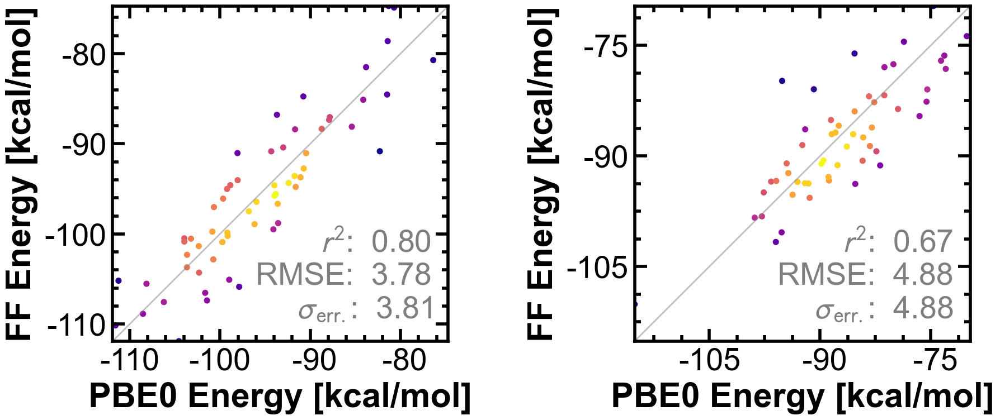

In [212]:
claplot | kplot

In [213]:
CLA

,KEY,target,residuals,vals,ion
37_13_CLA_15_1,37_13_CLA_15_1,-90.762046,-6.011345,-84.750700,CLA
37_14_CLA_16_1,37_14_CLA_16_1,-94.321714,-3.481756,-90.839960,CLA
37_15_CLA_17_1,37_15_CLA_17_1,-92.993648,-2.585124,-90.408520,CLA
37_16_CLA_18_1,37_16_CLA_18_1,-93.963950,0.649789,-94.613740,CLA
37_17_CLA_19_1,37_17_CLA_19_1,-81.485406,3.054107,-84.539510,CLA
37_1_CLA_0_1,37_1_CLA_0_1,-94.082692,5.409572,-99.492260,CLA
37_20_CLA_22_1,37_20_CLA_22_1,-80.715397,-5.821995,-74.893400,CLA
37_24_CLA_26_1,37_24_CLA_26_1,-87.907096,-0.562102,-87.344990,CLA
37_26_CLA_28_1,37_26_CLA_28_1,-90.459383,0.582525,-91.041910,CLA
37_27_CLA_29_1,37_27_CLA_29_1,-93.958810,1.810492,-95.769300,CLA


#  CI - water, dcm, k+ cl-

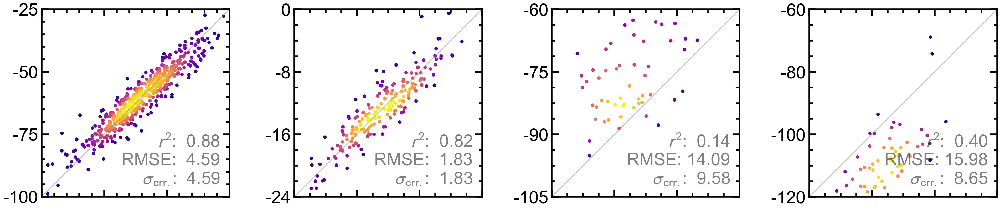

In [214]:
# data 

plt.set_cmap("plasma")

water = dataframes["ELECci_water_cluster_lj_elec.csv"]
dcm = dataframes["ELECci_dcm_lj_elec.csv"]

ions = dataframes["ELECci_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
cl = ions[ions["ion"] == "CLA" ]
k = ions[ions["ion"] == "POT" ]



waterAX = simple_residuals_plot(water, "",ylabel=FFintE_label, xlabel=intE_label)
dcmAX = simple_residuals_plot(dcm, "",ylabel=FFintE_label, xlabel=intE_label)
kAX = simple_residuals_plot(k, "",ylabel=FFintE_label, xlabel=intE_label)
clAX = simple_residuals_plot(cl, "",ylabel=FFintE_label, xlabel=intE_label)

ticks = [
[-25, -50, -75, -100],
    [0, -8, -16, -24],
    [-60, -75, -90, -105],
    [-60, -80, -100, -120],
]

for i, x in enumerate([waterAX, dcmAX, kAX, clAX]):
    # if i != 0:
    x.set_ylabel("")
    x.set_xlabel("")
    t = ticks[i]
    t.reverse()
    
    x.set_yticks(t)
    x.set_xticks(t)
    x.set_xticklabels([])
    x.set_xlim(min(t), max(t))
    x.set_ylim(min(t), max(t))
    
cifig = (waterAX | dcmAX | kAX | clAX)
cifig

In [215]:
4.59 ** 2

21.068099999999998

In [216]:
# plt.title(r"$r$ $\mathit{r}$")
# plt.show()

2023-10-10 10:41:37 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:41:37 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:41:37 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:41:37 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:41:37 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:41:37 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:41:37 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:41:37 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:41:37 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:41:37 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:41:37 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:41:37 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

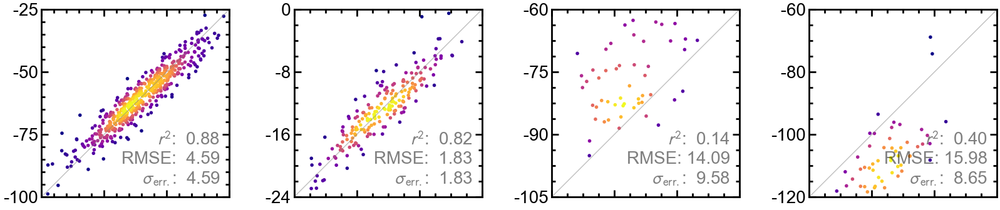

In [217]:
cifig.savefig("ci_lj.pdf")

#  PC - water, dcm, k+ cl-

In [218]:
# data 
water = dataframes["ELECp_water_cluster_lj_elec.csv"]
dcm = dataframes["ELECp_dcm_lj_elec.csv"]

ions = dataframes["ELECp_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
cl = ions[ions["ion"] == "CLA" ]
k = ions[ions["ion"] == "POT" ]
waterAX = simple_residuals_plot(water, "",ylabel=FFintE_label, xlabel=intE_label)
dcmAX = simple_residuals_plot(dcm, "",ylabel=FFintE_label, xlabel=intE_label)
kAX = simple_residuals_plot(k, "",ylabel=FFintE_label, xlabel=intE_label)
clAX = simple_residuals_plot(cl, "",ylabel=FFintE_label, xlabel=intE_label)

ticks = [
[-25, -50, -75, -100],
    [0, -8, -16, -24],
    [-60, -75, -90, -105],
    [-60, -80, -100, -120],
]

for i, x in enumerate([waterAX, dcmAX, kAX, clAX]):
    # if i != 0:
    x.set_ylabel("")
    x.set_xlabel("")
    t = ticks[i]
    t.reverse()
    
    x.set_yticks(t)
    x.set_xticks(t)
    x.set_xticklabels([])
    x.set_xlim(min(t), max(t))
    x.set_ylim(min(t), max(t))
    

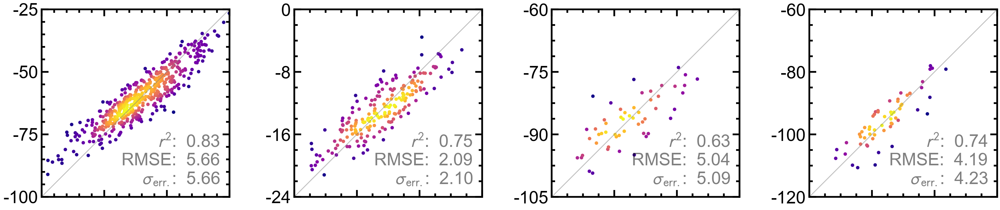

In [219]:
pcfig = (waterAX | dcmAX | kAX | clAX)
pcfig

2023-10-10 10:41:54 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:41:54 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:41:54 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:41:54 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:41:54 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:41:54 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:41:54 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:41:54 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:41:54 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:41:54 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:41:54 | DEBUG | loggingTools:__exit__:357 - Took 0.006s to load 'cmap'
2023-10-10 10:41:54 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

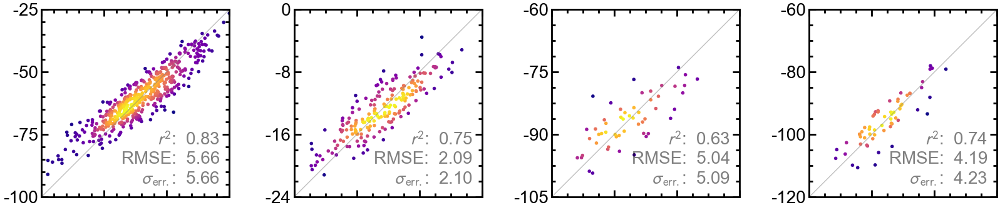

In [220]:
pcfig.savefig("pc_lj.pdf")

#  MDCM - water, dcm, k+ cl-

In [221]:
# data 
water = dataframes["ELECm_water_cluster_lj_elec.csv"]
dcm = dataframes["ELECm_dcm_lj_elec.csv"]
ions = dataframes["ELECm_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
cl = ions[ions["ion"] == "CLA" ]
k = ions[ions["ion"] == "POT" ]

waterAX = simple_residuals_plot(water, "",ylabel=FFintE_label, xlabel=intE_label)
dcmAX = simple_residuals_plot(dcm, "",ylabel=FFintE_label, xlabel=intE_label)
kAX = simple_residuals_plot(k, "",ylabel=FFintE_label, xlabel=intE_label)
clAX = simple_residuals_plot(cl, "",ylabel=FFintE_label, xlabel=intE_label)

ticks = [
[-25, -50, -75, -100],
    [0, -8, -16, -24],
    [-60, -75, -90, -105],
    [-60, -80, -100, -120],
]

for i, x in enumerate([waterAX, dcmAX, kAX, clAX]):
    # if i != 0:
    x.set_ylabel("")
    x.set_xlabel("")
    t = ticks[i]
    t.reverse()
    x.set_xticks(t)
    x.set_yticks(t)
    x.set_xlim(min(t), max(t))
    x.set_ylim(min(t), max(t))
    

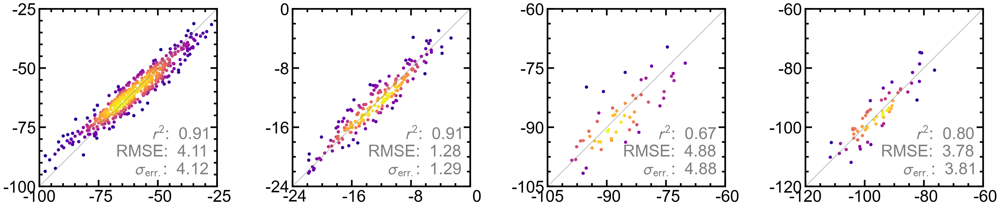

In [222]:
mdcmfig = (waterAX | dcmAX | kAX | clAX)
mdcmfig

2023-10-10 10:42:10 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:42:10 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:42:10 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:42:10 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:42:10 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:42:10 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:42:10 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:42:10 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:42:10 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:42:10 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:42:10 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:42:10 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

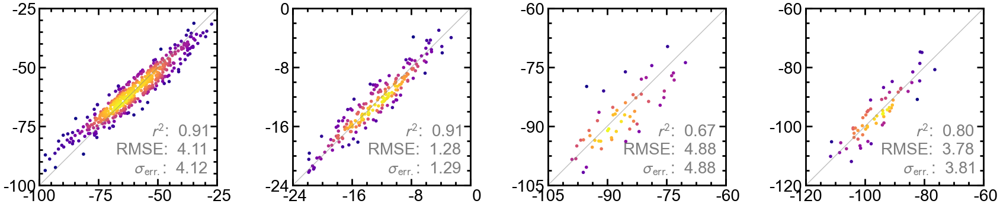

In [223]:
mdcmfig.savefig("mdcm_lj.pdf")

In [224]:
combined = pw.stack([pcfig, mdcmfig, cifig], operator="/", margin=0.0) #.savefig("CI_combined.pdf")

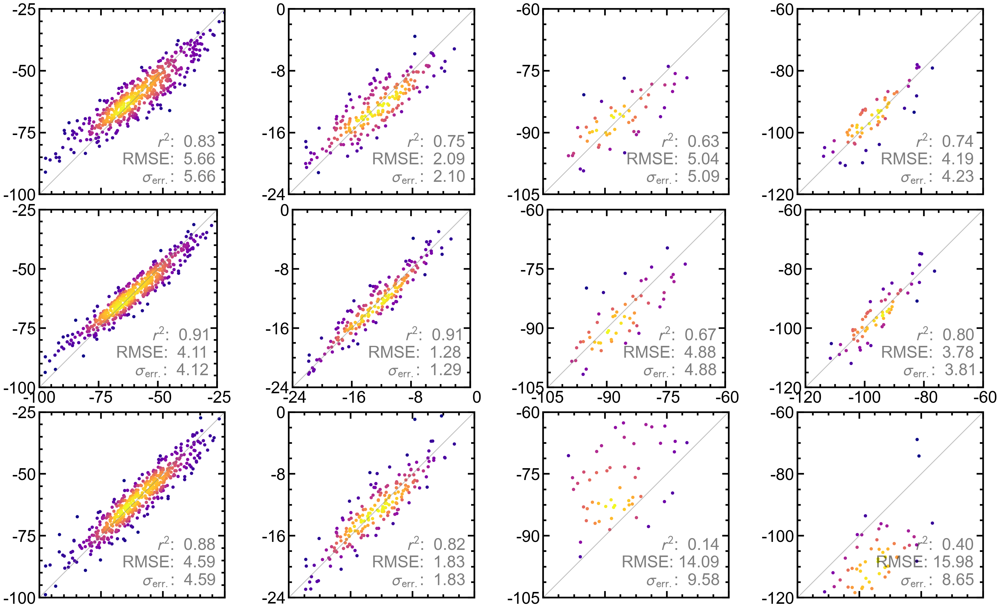

In [225]:
combined

In [226]:
combined.set_supylabel("FF Energy [kcal/mol]")
combined.set_supxlabel("PBE0 Energy [kcal/mol]")
combined.set_supspine("bottom")
combined.set_supspine("left")

2023-10-10 10:42:38 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:42:38 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:42:38 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:42:38 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:42:38 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:42:38 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:42:38 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:42:38 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:42:38 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:42:38 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:42:38 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:42:38 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

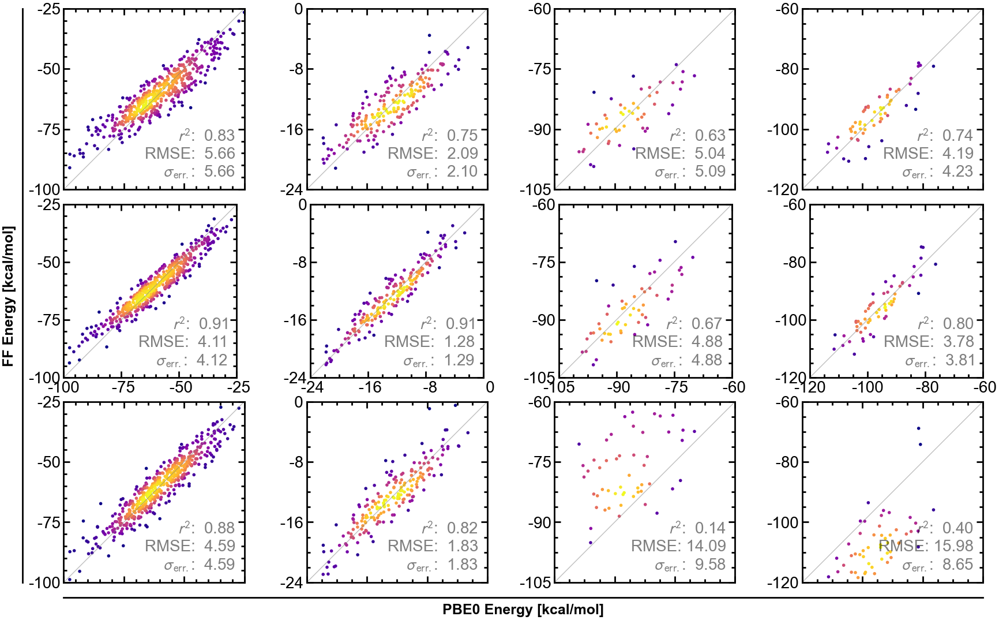

In [227]:
combined.savefig("CIpm_combined.pdf")

In [228]:
dataframes.keys()

dict_keys(['ELECci_dcm_de_intE_elec.csv', 'ELECci_dcm_lj_elec.csv', 'ELECci_ions_ext_de_intE_elec.csv', 'ELECci_ions_ext_lj_intE_elec.csv', 'ELECci_water_cluster_de_intE_elec.csv', 'ELECci_water_cluster_lj_MMintE_elec.csv', 'ELECci_water_cluster_lj_elec.csv', 'ELECci_water_cluster_lj_intE_elec.csv', 'ELECk_water_cluster_lj_MMintE_elec.csv', 'ELECk_water_cluster_lj_elec.csv', 'ELECk_water_cluster_lj_intE_elec.csv', 'ELECkpol_water_cluster_lj_MMintE_elec.csv', 'ELECkpol_water_cluster_lj_elec.csv', 'ELECkpol_water_cluster_lj_intE_elec.csv', 'ELECm_dcm_de_intE_elec.csv', 'ELECm_dcm_lj_elec.csv', 'ELECm_ions_ext_de_intE_elec.csv', 'ELECm_ions_ext_lj_intE_elec.csv', 'ELECm_water_cluster_de_intE_elec.csv', 'ELECm_water_cluster_lj_MMintE_elec.csv', 'ELECm_water_cluster_lj_elec.csv', 'ELECmpol_dcm_de_intE_elec.csv', 'ELECmpol_dcm_lj_elec.csv', 'ELECmpol_ions_ext_de_intE_elec.csv', 'ELECmpol_ions_ext_lj_intE_elec.csv', 'ELECmpol_water_cluster_de_intE_elec.csv', 'ELECmpol_water_cluster_lj_MMintE_

#  pol - water, dcm, k+ cl-

In [229]:
# data 
water = dataframes["ELECpol_water_cluster_lj_elec.csv"]
dcm = dataframes["ELECpol_dcm_lj_elec.csv"]
ions = dataframes["ELECpol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
cl = ions[ions["ion"] == "CLA" ]
k = ions[ions["ion"] == "POT" ]
# cl  = dataframes["ELECpol_ions_ext_lj_intE_elec.csv_CLA"]
# k = dataframes["ELECpol_ions_ext_lj_intE_elec.csv_POT"]
# cl = cl.reindex()
# k = k.reindex()
waterAX = simple_residuals_plot(water, "",ylabel=FFintE_label, xlabel=intE_label)
dcmAX = simple_residuals_plot(dcm, "",ylabel=FFintE_label, xlabel=intE_label)
kAX = simple_residuals_plot(k, "",ylabel=FFintE_label, xlabel=intE_label)
clAX = simple_residuals_plot(cl, "",ylabel=FFintE_label, xlabel=intE_label)

# for i, x in enumerate([waterAX, dcmAX, kAX, clAX]):
#     if i != 0:
#         x.set_ylabel("")
#     x.set_xlabel("")

ticks = [
[-25, -50, -75, -100],
    [0, -8, -16, -24],
    [-60, -75, -90, -105],
    [-60, -80, -100, -120],
]

for i, x in enumerate([waterAX, dcmAX, kAX, clAX]):
    # if i != 0:
    x.set_ylabel("")
    x.set_xlabel("")
    t = ticks[i]
    t.reverse()
    
    x.set_yticks(t)
    x.set_xticks(t)
    x.set_xticklabels([])
    x.set_xlim(min(t), max(t))
    x.set_ylim(min(t), max(t))
    
# cifig = (waterAX | dcmAX | kAX | clAX)
# cifig

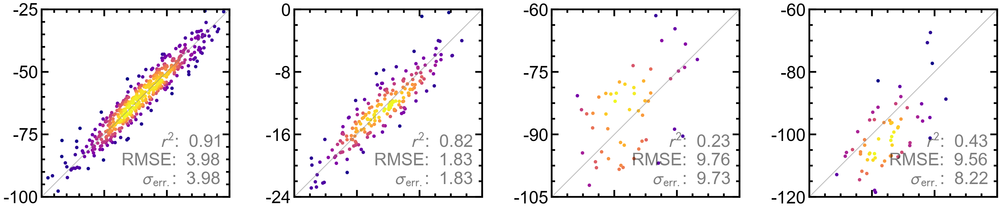

In [230]:
polfig = (waterAX | dcmAX | kAX | clAX)
polfig

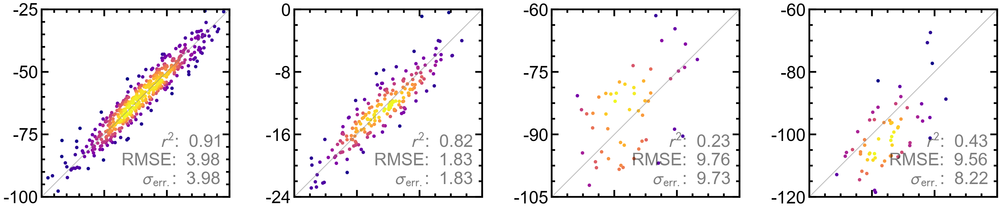

In [231]:
polfig


2023-10-10 10:42:58 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:42:58 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:42:58 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:42:58 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:42:58 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:42:58 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:42:58 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:42:58 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:42:58 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:42:58 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:42:58 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:42:58 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

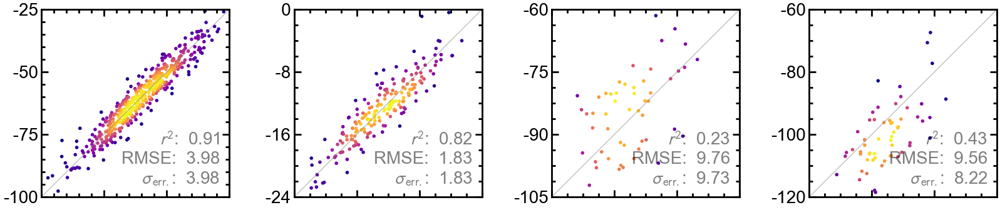

In [232]:
polfig.savefig("pol_lj.pdf")

# Mpol Ppol figures

In [233]:
# data 
pwater = dataframes["ELECppol_water_cluster_lj_elec.csv"]
pdcm = dataframes["ELECppol_dcm_lj_elec.csv"]


ions = dataframes["ELECppol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
pcl = ions[ions["ion"] == "CLA" ]
pk = ions[ions["ion"] == "POT" ]

pwaterAX = simple_residuals_plot(pwater, "", ylabel=FFintE_label)
pdcmAX = simple_residuals_plot(pdcm, "")
pkAX = simple_residuals_plot(pk, "")
pclAX = simple_residuals_plot(pcl, "")

ticks = [
[-25, -50, -75, -100],
    [0, -8, -16, -24],
    [-60, -75, -90, -105],
    [-60, -80, -100, -120],
]


for i, x in enumerate([pwaterAX, pdcmAX, pkAX, pclAX]):
    # if i != 0:
    x.set_ylabel("")
    x.set_xlabel("")
    t = ticks[i]
    t.reverse()
    
    x.set_yticks(t)
    x.set_xticks(t)
    x.set_xticklabels([])
    x.set_xlim(min(t), max(t))
    x.set_ylim(min(t), max(t))

mwater = dataframes["ELECmpol_water_cluster_lj_elec.csv"]
mdcm = dataframes["ELECmpol_dcm_lj_elec.csv"]
ions = dataframes["ELECmpol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
mcl = ions[ions["ion"] == "CLA" ]
mk = ions[ions["ion"] == "POT" ]

mwaterAX = simple_residuals_plot(mwater, "", ylabel=FFintE_label, xlabel=intE_label)
mdcmAX = simple_residuals_plot(mdcm, "", xlabel=intE_label)
mkAX = simple_residuals_plot(mk, "", xlabel=intE_label)
mclAX = simple_residuals_plot(mcl, "", xlabel=intE_label)

# for i, x in enumerate([mdcmAX, mkAX, mclAX]):
ticks = [
[-25, -50, -75, -100],
    [0, -8, -16, -24],
    [-60, -75, -90, -105],
    [-60, -80, -100, -120],
]

for i, x in enumerate([mwaterAX, mdcmAX, mkAX, mclAX]):
    # if i != 0:
    x.set_ylabel("")
    x.set_xlabel("")
    t = ticks[i]
    t.reverse()
    
    x.set_yticks(t)
    x.set_xticks(t)
    # x.set_xticklabels([])
    x.set_xlim(min(t), max(t))
    x.set_ylim(min(t), max(t))
    
# cifig = (waterAX | dcmAX | kAX | clAX)
# cifig



In [234]:
# data 
pwater = dataframes["ELECp_water_cluster_lj_elec.csv"]
pdcm = dataframes["ELECp_dcm_lj_elec.csv"]


ions = dataframes["ELECp_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
pcl = ions[ions["ion"] == "CLA" ]
pk = ions[ions["ion"] == "POT" ]

# pwaterAX = simple_residuals_plot(pwater, "", ylabel=FFintE_label)
# pdcmAX = simple_residuals_plot(pdcm, "")
# pkAX = simple_residuals_plot(pk, "")
# pclAX = simple_residuals_plot(pcl, "")

# for i, x in enumerate([pwaterAX, pdcmAX, pkAX, pclAX]):
#     if i != 0:
#         x.set_ylabel("")
#     x.set_xlabel("")

mwater = dataframes["ELECm_water_cluster_lj_elec.csv"]
mdcm = dataframes["ELECm_dcm_lj_elec.csv"]
ions = dataframes["ELECm_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
mcl = ions[ions["ion"] == "CLA" ]
mk = ions[ions["ion"] == "POT" ]

axes = []
for i, _ in enumerate([pwater, pdcm, pcl, mk, mwater, mdcm, mcl, mk,]):
    x = 2 if x != 0 or x!= 4 else 3
    y = 2 if x < 4 else 3
    ax = pw.Brick(figsize=(x,y))
    ax.hist(_["residuals"], bins=len(_)//4, density=True, 
            fill=True, color="k", alpha=0.25, histtype='step',)
    ax.hist(_["residuals"], bins=len(_)//4, density=False, weights=[1/len(_)*0.5]*len(_),
            cumulative=True, fill=False, histtype='step',)
    ax.set_xlim(-20,20)
    ax.set_ylim(0,0.5)
    ax.axvline(_["residuals"].min())
    ax.axhline(0.25,c="k",alpha=0.42)
    ax.axvline(0,c="k",alpha=0.42)
    
    med = _["residuals"].median()
    esd = np.std(_["residuals"])
    stat_string = f"M: {med:.1f}\n"+"$\sigma_{\delta}$: "+ f"{esd:.1f}"
    ax.text(-17, 0.25, stat_string, fontsize=15)
    
    #  set xticks
    # if i < 4:
    ax.set_xticks([-10,0,10])
    ax.set_xticklabels([])
    # else:
        # ax.set_xticks([-10,0,10])
    #  set yticks
    if i != 0 and i != 4:
        ax.set_yticklabels([])
    else:
        ax.set_yticks([0.25], ["0.25 \n(0.50)"])
    
    axes.append(ax)
    
top = pw.stack(axes[:4], operator="|", margin=0.0,equal_spacing=True)
bottom = pw.stack(axes[4:], operator="|", margin=0.0,equal_spacing=True)
error_fig1 = pw.stack([top, bottom], margin=0, operator="/", equal_spacing=True)
# error_fig1

In [235]:
# data 
pwater = dataframes["ELECppol_water_cluster_lj_elec.csv"]
pdcm = dataframes["ELECppol_dcm_lj_elec.csv"]


ions = dataframes["ELECppol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
pcl = ions[ions["ion"] == "CLA" ]
pk = ions[ions["ion"] == "POT" ]

# pwaterAX = simple_residuals_plot(pwater, "", ylabel=FFintE_label)
# pdcmAX = simple_residuals_plot(pdcm, "")
# pkAX = simple_residuals_plot(pk, "")
# pclAX = simple_residuals_plot(pcl, "")

# for i, x in enumerate([pwaterAX, pdcmAX, pkAX, pclAX]):
#     if i != 0:
#         x.set_ylabel("")
#     x.set_xlabel("")

mwater = dataframes["ELECmpol_water_cluster_lj_elec.csv"]
mdcm = dataframes["ELECmpol_dcm_lj_elec.csv"]
ions = dataframes["ELECmpol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
mcl = ions[ions["ion"] == "CLA" ]
mk = ions[ions["ion"] == "POT" ]


axes = []
for i, _ in enumerate([pwater, pdcm, pcl, mk, mwater, mdcm, mcl, mk,]):
    x = 2 if x != 0 or x!= 4 else 3
    y = 2 if x < 4 else 3
    ax = pw.Brick(figsize=(x,y))
    ax.hist(_["residuals"], bins=len(_)//4, density=True, 
            fill=True, color="k", alpha=0.25, histtype='step',)
    ax.hist(_["residuals"], bins=len(_)//4, density=False, weights=[1/len(_)*0.5]*len(_),
            cumulative=True, fill=False, histtype='step',)
    ax.set_xlim(-20,20)
    ax.set_ylim(0,0.5)
    ax.axvline(_["residuals"].min())
    ax.axhline(0.25,c="k",alpha=0.42)
    ax.axvline(0,c="k",alpha=0.42)
    med = _["residuals"].median()
    esd = np.std(_["residuals"])
    stat_string = f"M: {med:.1f}\n"+"$\sigma_{\delta}$: "+ f"{esd:.1f}"
    ax.text(-17, 0.25, stat_string, fontsize=15)
    
    #  set xticks
    if i < 4:
        ax.set_xticks([-10,0,10])
        ax.set_xticklabels([])
    else:
        ax.set_xticks([-10,0,10])
    #  set yticks
    if i != 0 and i != 4:
        ax.set_yticklabels([])
    else:
        ax.set_yticks([0.25], ["0.25 \n(0.50)"])
    
    axes.append(ax)
    
top = pw.stack(axes[:4], operator="|", margin=0.0,equal_spacing=True)
bottom = pw.stack(axes[4:], operator="|", margin=0.0,equal_spacing=True)
error_fig2 = pw.stack([top, bottom], margin=0, operator="/", equal_spacing=True)
# error_fig2

#  Error plots


In [236]:
error_fig_ = (error_fig1 / error_fig2)

In [237]:
error_fig_.set_supxlabel("Errors [kcal/mol]")
error_fig_.set_supylabel("$P(x)$, ($~\\sum{P(x)}$)")
error_fig_.set_supspine("bottom")
error_fig_.set_supspine("left")

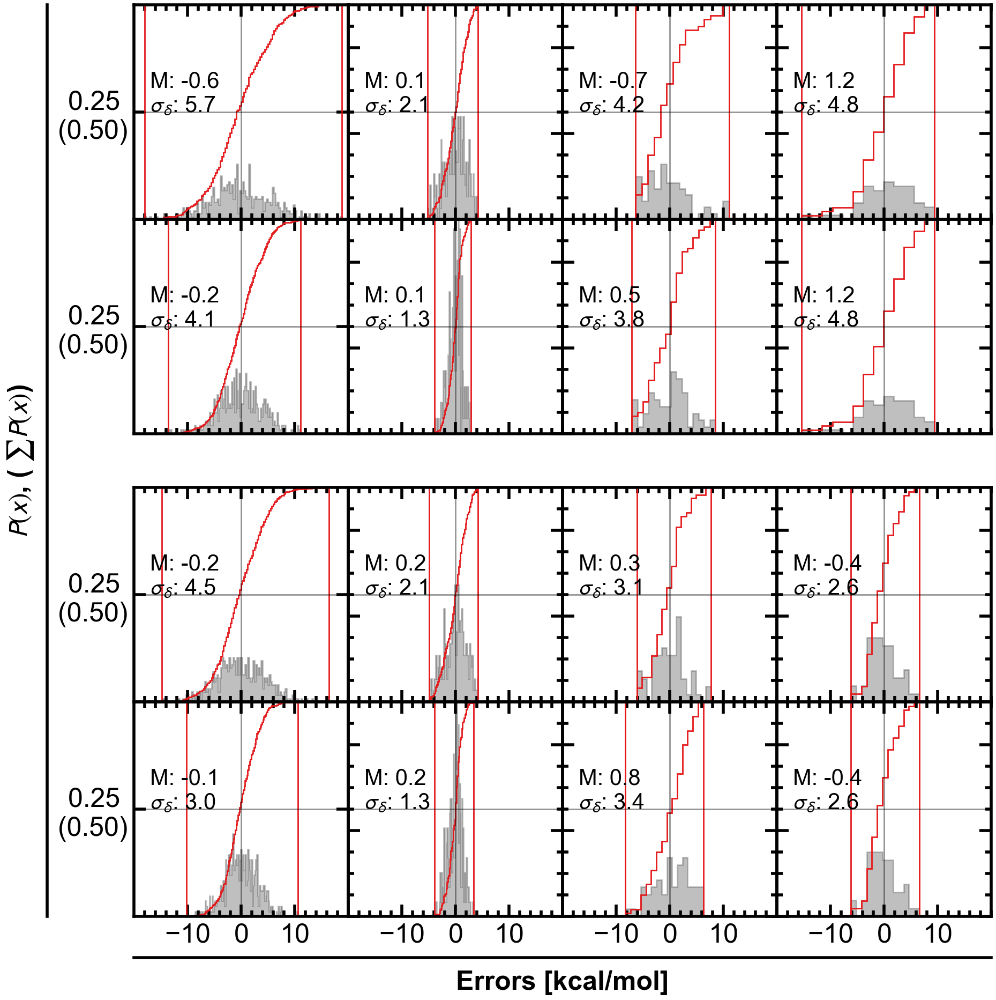

In [238]:
error_fig_

2023-10-10 10:43:55 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:43:55 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:43:55 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:43:55 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:43:55 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:43:55 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:43:55 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:43:55 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:43:55 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:43:55 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:43:55 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:43:55 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

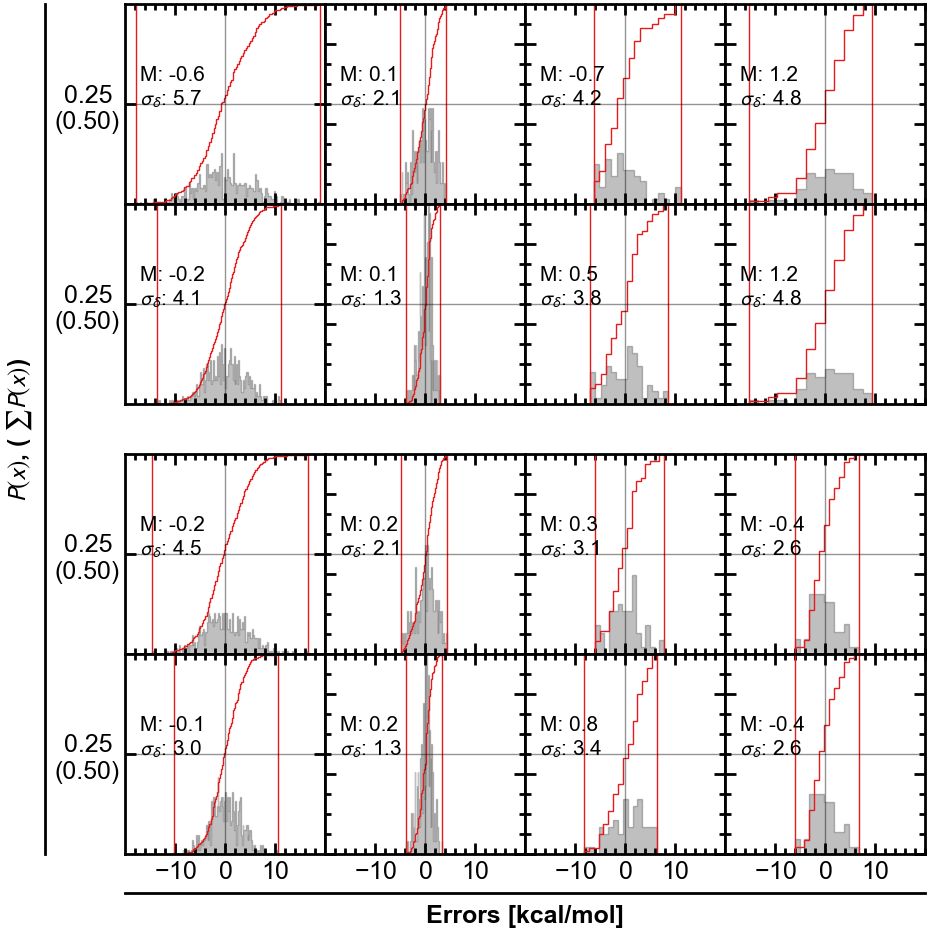

In [239]:
error_fig_.savefig("error_summary_mdcm_p_pol.pdf")

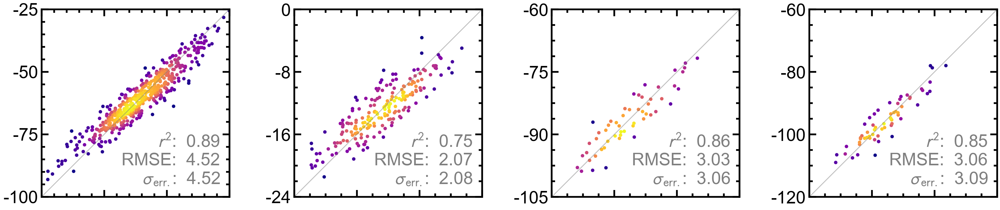

In [240]:
ppolfig = (pwaterAX | pdcmAX | pkAX | pclAX)
ppolfig

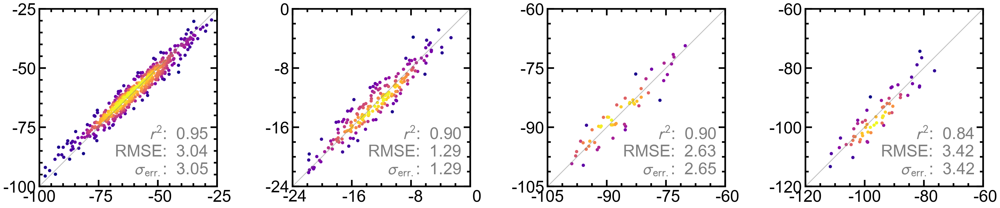

In [241]:
mpolfig = (mwaterAX | mdcmAX | mkAX | mclAX)
mpolfig

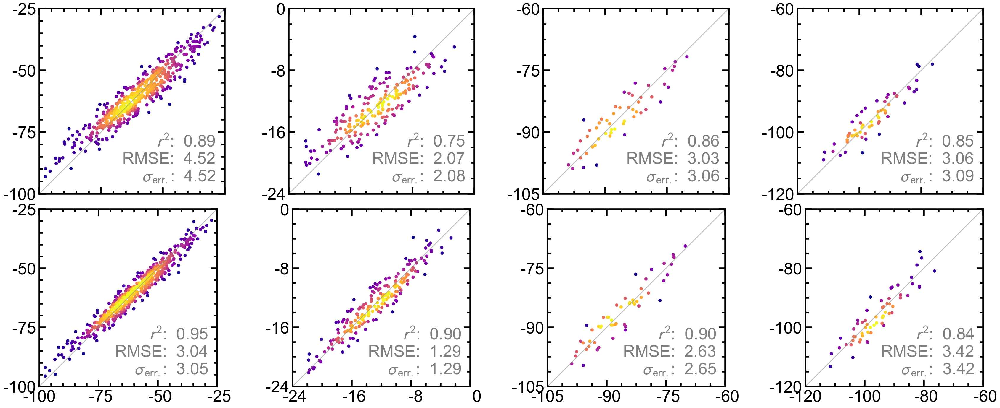

In [242]:
mppolfig = pw.stack([ppolfig, mpolfig], operator="/", margin=0.)
mppolfig

In [243]:
pol_combined = pw.stack([mppolfig, polfig, ], margin=0.1, operator="/") 
#.savefig("pol_lj_fig3.pdf")

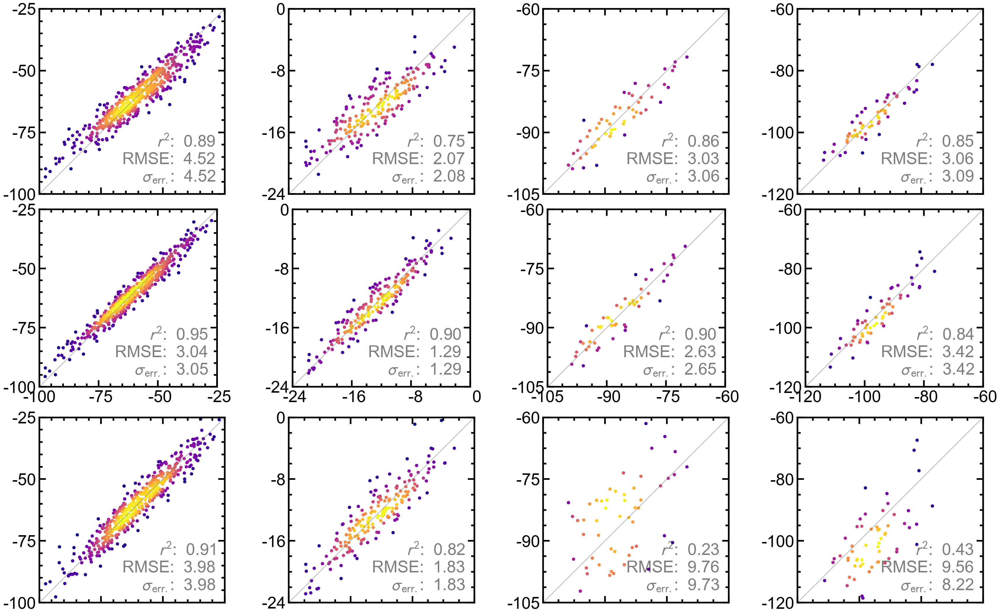

In [244]:
pol_combined

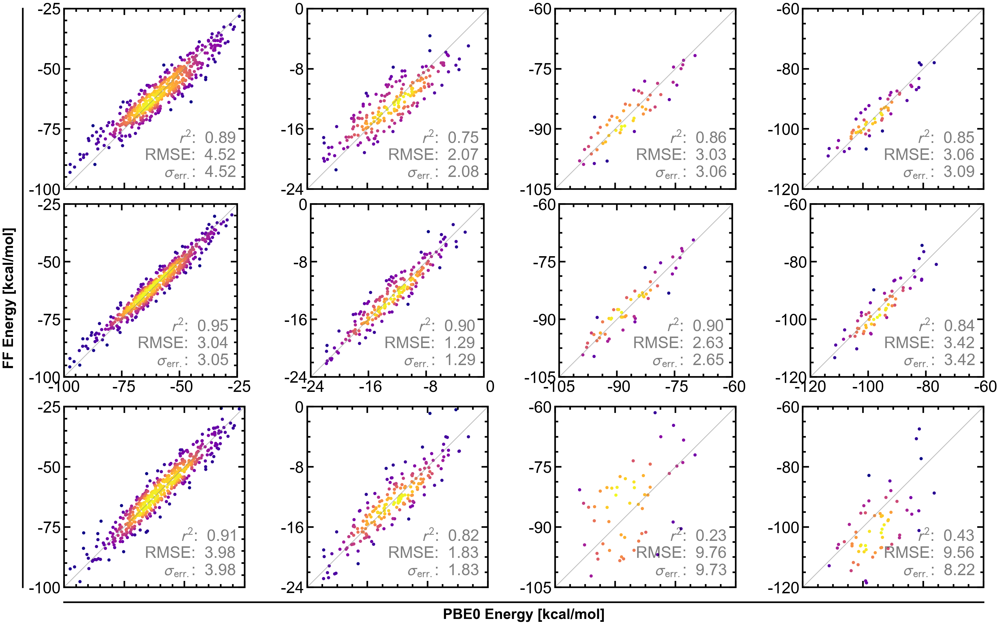

In [245]:
# pol_combined

pol_combined.set_supylabel("FF Energy [kcal/mol]")
pol_combined.set_supxlabel("PBE0 Energy [kcal/mol]")
pol_combined.set_supspine("bottom")
pol_combined.set_supspine("left")
pol_combined

2023-10-10 10:44:35 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:44:35 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:44:35 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:44:35 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:44:35 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:44:35 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:44:35 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:44:35 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:44:35 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:44:35 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:44:35 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:44:35 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

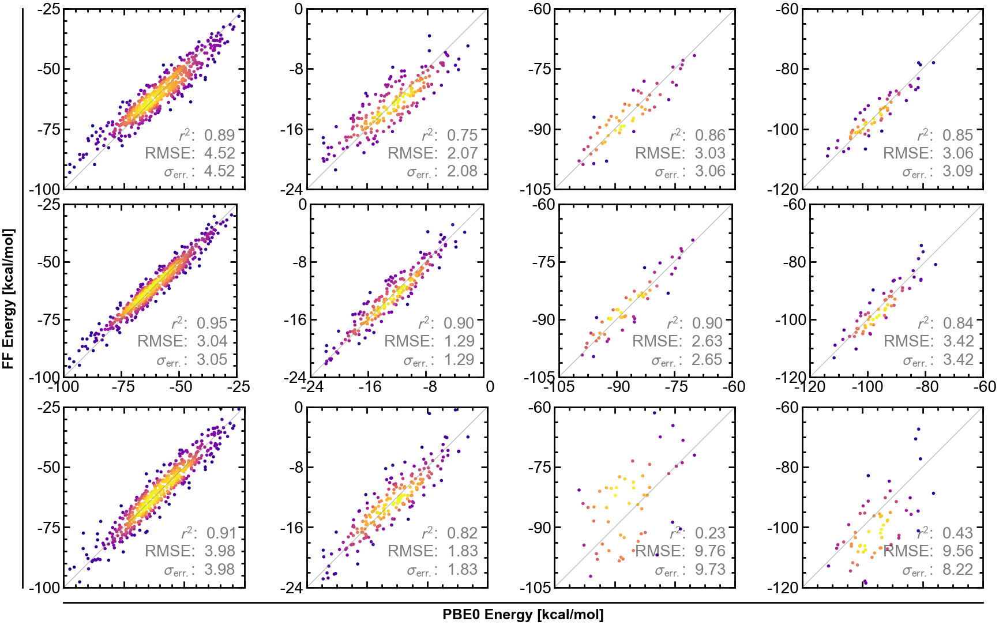

In [246]:
pol_combined.savefig("pol_lj_fig3.pdf")

2023-10-10 10:44:40 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-10 10:44:40 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-10 10:44:40 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-10 10:44:40 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-10 10:44:40 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-10 10:44:40 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-10 10:44:40 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-10 10:44:40 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-10 10:44:40 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-10 10:44:40 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-10 10:44:40 | DEBUG | loggingTools:__exit__:357 - Took 0.005s to load 'cmap'
2023-10-10 10:44:40 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

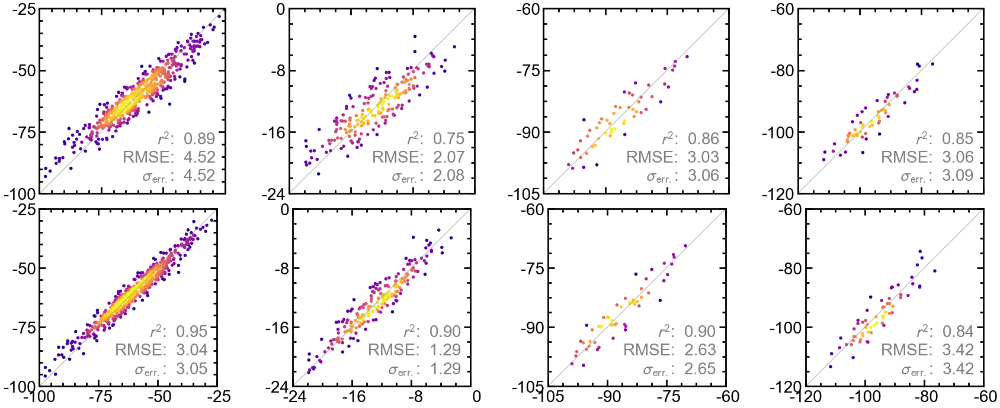

In [247]:
mppolfig.savefig("mpol_ppol_lj.pdf")

In [248]:
# data 
pwater = dataframes["ELECppol_water_cluster_lj_elec.csv"]
pdcm = dataframes["ELECppol_dcm_lj_elec.csv"]


ions = dataframes["ELECppol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
pcl = ions[ions["ion"] == "CLA" ]
pk = ions[ions["ion"] == "POT" ]

# pwaterAX = simple_residuals_plot(pwater, "", ylabel=FFintE_label)
# pdcmAX = simple_residuals_plot(pdcm, "")
# pkAX = simple_residuals_plot(pk, "")
# pclAX = simple_residuals_plot(pcl, "")

# for i, x in enumerate([pwaterAX, pdcmAX, pkAX, pclAX]):
#     if i != 0:
#         x.set_ylabel("")
#     x.set_xlabel("")

mwater = dataframes["ELECmpol_water_cluster_lj_elec.csv"]
mdcm = dataframes["ELECmpol_dcm_lj_elec.csv"]
ions = dataframes["ELECmpol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
mcl = ions[ions["ion"] == "CLA" ]
mk = ions[ions["ion"] == "POT" ]

# mwaterAX = simple_residuals_plot(mwater, "", ylabel=FFintE_label, xlabel=intE_label)
# mdcmAX = simple_residuals_plot(mdcm, "", xlabel=intE_label)
# mkAX = simple_residuals_plot(mk, "", xlabel=intE_label)
# mclAX = simple_residuals_plot(mcl, "", xlabel=intE_label)

# for i, x in enumerate([mdcmAX, mkAX, mclAX]):
#     x.set_ylabel("")



In [249]:
# data 
pwater = dataframes["ELECppol_water_cluster_lj_elec.csv"]
pdcm = dataframes["ELECppol_dcm_lj_elec.csv"]


ions = dataframes["ELECppol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
pcl = ions[ions["ion"] == "CLA" ]
pk = ions[ions["ion"] == "POT" ]

# pwaterAX = simple_residuals_plot(pwater, "", ylabel=FFintE_label)
# pdcmAX = simple_residuals_plot(pdcm, "")
# pkAX = simple_residuals_plot(pk, "")
# pclAX = simple_residuals_plot(pcl, "")

# for i, x in enumerate([pwaterAX, pdcmAX, pkAX, pclAX]):
#     if i != 0:
#         x.set_ylabel("")
#     x.set_xlabel("")

mwater = dataframes["ELECmpol_water_cluster_lj_elec.csv"]
mdcm = dataframes["ELECmpol_dcm_lj_elec.csv"]
ions = dataframes["ELECmpol_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
mcl = ions[ions["ion"] == "CLA" ]
mk = ions[ions["ion"] == "POT" ]

# mwaterAX = simple_residuals_plot(mwater, "", ylabel=FFintE_label, xlabel=intE_label)
# mdcmAX = simple_residuals_plot(mdcm, "", xlabel=intE_label)
# mkAX = simple_residuals_plot(mk, "", xlabel=intE_label)
# mclAX = simple_residuals_plot(mcl, "", xlabel=intE_label)

# for i, x in enumerate([mdcmAX, mkAX, mclAX]):
#     x.set_ylabel("")




axes = []
for _ in [pwater, pdcm, pcl, mk, mwater, mdcm, mcl, mk,]:
    ax = pw.Brick(figsize=(2,2))
    ax.hist(_["residuals"], bins=len(_)//4, density=True, fill=True, color="k", alpha=0.5, histtype='step',)
    ax.hist(_["residuals"], bins=len(_)//4, density=False, weights=[1/len(_)*0.5]*len(_),
            cumulative=True, fill=False, histtype='step',)
    ax.set_xlim(_["residuals"].min(),_["residuals"].max())
    ax.set_ylim(0,0.5)
    ax.axvline(_["residuals"].median(), color="blue")
    ax.axvline(_["residuals"].min())
    ax.axhline(0.25,c="k",alpha=0.42)
    ax.axvline(0,c="k",alpha=0.42)
    axes.append(ax)
    
pol_error_dists = pw.stack(axes[:4], operator="|") / pw.stack(axes[4:], operator="|")

In [250]:
# data 
pwater = dataframes["ELECp_water_cluster_lj_elec.csv"]
pdcm = dataframes["ELECp_dcm_lj_elec.csv"]


ions = dataframes["ELECp_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
pcl = ions[ions["ion"] == "CLA" ]
pk = ions[ions["ion"] == "POT" ]

# pwaterAX = simple_residuals_plot(pwater, "", ylabel=FFintE_label)
# pdcmAX = simple_residuals_plot(pdcm, "")
# pkAX = simple_residuals_plot(pk, "")
# pclAX = simple_residuals_plot(pcl, "")

# for i, x in enumerate([pwaterAX, pdcmAX, pkAX, pclAX]):
#     if i != 0:
#         x.set_ylabel("")
#     x.set_xlabel("")

mwater = dataframes["ELECm_water_cluster_lj_elec.csv"]
mdcm = dataframes["ELECm_dcm_lj_elec.csv"]
ions = dataframes["ELECm_ions_ext_lj_intE_elec.csv"]
ions.index = list(ions["KEY"])
ions["ion"] = ions["KEY"].apply(lambda x: x.split("_")[2])
mcl = ions[ions["ion"] == "CLA" ]
mk = ions[ions["ion"] == "POT" ]

# mwaterAX = simple_residuals_plot(mwater, "", ylabel=FFintE_label, xlabel=intE_label)
# mdcmAX = simple_residuals_plot(mdcm, "", xlabel=intE_label)
# mkAX = simple_residuals_plot(mk, "", xlabel=intE_label)
# mclAX = simple_residuals_plot(mcl, "", xlabel=intE_label)

# for i, x in enumerate([mdcmAX, mkAX, mclAX]):
#     x.set_ylabel("")




axes = []
for _ in [pwater, pdcm, pcl, mk, mwater, mdcm, mcl, mk,]:
    ax = pw.Brick(figsize=(2,2))
    ax.hist(_["residuals"], bins=len(_)//4, density=True, fill=True, color="k", alpha=0.5, histtype='step',)
    ax.hist(_["residuals"], bins=len(_)//4, density=False, weights=[1/len(_)*0.5]*len(_),
            cumulative=True, fill=False, histtype='step',)
    ax.set_xlim(_["residuals"].min(),_["residuals"].max())
    ax.set_ylim(0,0.5)
    ax.axvline(_["residuals"].min())
    ax.axvline(_["residuals"].median(), color="blue")
    ax.axhline(0.25,c="k",alpha=0.42)
    ax.axvline(0,c="k",alpha=0.42)
    axes.append(ax)
    
standard_error_dists = pw.stack(axes[:4], operator="|") / pw.stack(axes[4:], operator="|")

In [251]:
# standard_error_dists / pol_error_dists

#  Error Distributions

In [441]:

def residuals_plot(df_test, label,
                   title="", LABEL_SIZE=10,
                   xlabel=None, ylabel=None):
    if xlabel is None:
        xlabel = "target"
    if ylabel is None:
        ylabel = "observation"

    #  color by residuals
    cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    norm = plt.Normalize(-5,
                         5)
    
    normabs = plt.Normalize(-5,
                            5)

    pw.overwrite_axisgrid()
    FIGSIZE = (3, 3)
    TITLE_SIZE = 10

    target_mean = df_test["target"].mean()
    residuals_mean = df_test["residuals"].mean()
    vals_mean = df_test["vals"].mean()
    target_sd = df_test["target"].std()
    residuals_sd = df_test["residuals"].std()
    vals_sd = df_test["vals"].std()
    target_max = df_test["target"].max()
    residuals_max = df_test["residuals"].max()
    vals_max = df_test["vals"].max()
    target_min = df_test["target"].min()
    residuals_min = df_test["residuals"].min()
    vals_min = df_test["vals"].min()

    RMSE = np.sqrt(np.mean(df_test["residuals"] ** 2))
    MAE = np.mean(np.abs(df_test["residuals"]))
    r2 = np.corrcoef(df_test["target"], df_test["vals"])[0, 1] ** 2

    bounds = (np.min([target_min, vals_min, ]),
              np.max([target_max, vals_max, ]))

    distax = pw.Brick(figsize=(FIGSIZE[0], FIGSIZE[1] * 3 / 4))
    distax.set_title(title)
    _ = sns.kdeplot(data=df_test, x="target", color="k",
                    ax=distax, label="target", linestyle="--")
    _ = sns.kdeplot(data=df_test, x="vals", color="k",
                    ax=distax, label="fit")



    strs = "" #f"RMSE: {RMSE:6.2f}\n" 
    # strs += '$\sigma_{\mathrm{err.}}$: ' + f"{residuals_sd :6.1f}\n"
    strs += r"    $\Delta \overline{x}$ : "+f"{target_mean - vals_mean :6.2f}\n"
    strs += r"    $\Delta \sigma$ : "+f"{target_sd - vals_sd :6.2f}"
    distax.text(0.05, 0.6, strs,
                horizontalalignment='left', c="k",
                bbox=dict(facecolor='white', alpha=0.5),
                transform=distax.transAxes,
                fontdict={"size": LABEL_SIZE})


    x_vals = np.zeros(len(df_test) * 2)
    y_vals = np.zeros(len(df_test) * 2)
    x_vals[0::2] = df_test["target"]
    x_vals[1::2] = df_test["vals"]
    y_vals[1::2] = [0.035] * len(df_test)

    for i in range(len(df_test)):
        res = df_test["residuals"].iloc[i]
        normed = norm(res)
        c = cmap(normed)
        alph = normabs(abs(res))
        # print(alph)
        distax.plot(
            x_vals[i * 2:i * 2 + 2],
            y_vals[i * 2:i * 2 + 2],
            alpha=alph/10,
            c=c
        )
    # distax.set_ylim(0.04)

    return distax

In [442]:
# list(dataframes.keys())

In [443]:
import warnings
warnings.filterwarnings('ignore')
import logging

logging.getLogger("requests").setLevel(logging.WARNING)
logging.getLogger("patchworklib").setLevel(logging.WARNING)
logging.getLogger("matplotlib").setLevel(logging.WARNING)

In [444]:
# ELECmpol_dcm_lj_elec
residuals_plot(dataframes["ELECpol_dcm_lj_elec.csv"], "") / residuals_plot(dataframes["ELECmpol_dcm_lj_elec.csv"], "")

2023-10-24 11:54:14 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-24 11:54:14 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-24 11:54:14 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-24 11:54:14 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-24 11:54:14 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-24 11:54:14 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-24 11:54:14 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-24 11:54:14 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-24 11:54:14 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-24 11:54:14 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-24 11:54:14 | DEBUG | loggingTools:__exit__:357 - Took 0.003s to load 'cmap'
2023-10-24 11:54:14 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

In [445]:
# residuals_plot(dataframes["ELECpol_ions_ext_lj_intE_elec.csv_CLA"], "")

In [446]:
# residuals_plot(dataframes["ELECpol_ions_ext_lj_intE_elec.csv_POT"], "")

In [447]:
# residuals_plot(dataframes["ELECmpol_ions_ext_lj_intE_elec.csv_CLA"], "")

In [448]:
# residuals_plot(dataframes["ELECmpol_ions_ext_lj_intE_elec.csv_POT"], "")

In [457]:
m_lj = residuals_plot(dataframes["ELECm_water_cluster_lj_elec.csv"], "")
ci_lj = residuals_plot(dataframes["ELECci_water_cluster_lj_elec.csv"], "")
ci_de = residuals_plot(dataframes["ELECci_water_cluster_de_intE_elec.csv"], "")
m_de = residuals_plot(dataframes["ELECm_water_cluster_de_intE_elec.csv"], "")
(ci_lj | m_lj ) / (ci_de | m_de)

2023-10-24 11:54:55 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-24 11:54:55 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-24 11:54:55 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-24 11:54:55 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-24 11:54:55 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-24 11:54:55 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-24 11:54:55 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-24 11:54:55 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-24 11:54:55 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-24 11:54:55 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-24 11:54:55 | DEBUG | loggingTools:__exit__:357 - Took 0.003s to load 'cmap'
2023-10-24 11:54:55 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

In [458]:
pw.stack([ci_lj, m_de], operator="/", margin=0)

2023-10-24 11:55:05 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-24 11:55:05 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-24 11:55:05 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-24 11:55:05 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-24 11:55:05 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-24 11:55:05 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-24 11:55:05 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-24 11:55:05 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-24 11:55:05 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-24 11:55:05 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-24 11:55:05 | DEBUG | loggingTools:__exit__:357 - Took 0.003s to load 'cmap'
2023-10-24 11:55:05 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

In [499]:
m_lj = residuals_plot(dataframes["ELECmpol_water_cluster_lj_elec.csv"], "")
ci_lj = residuals_plot(dataframes["ELECpol_water_cluster_lj_elec.csv"], "")
ci_de = residuals_plot(dataframes["ELECpol_water_cluster_de_intE_elec.csv"], "")
m_de = residuals_plot(dataframes["ELECmpol_water_cluster_de_intE_elec.csv"], "")

for _ in [ci_lj , m_lj ,  ci_de , m_de]:
    _.set_ylim(0, 0.03)
    _.set_xlabel("PBE Energy")

dists_and_errors = pw.stack([(ci_lj | m_lj ), (ci_de | m_de)], operator="/", margin=0.1)

#  Error dists scatter

In [500]:
pollj_res = simple_residuals_plot(
    dataframes["ELECpol_water_cluster_lj_elec.csv"], "", resColor=True,
    KDE=True
)
m_res = simple_residuals_plot(
    dataframes["ELECmpol_water_cluster_de_intE_elec.csv"], "", resColor=True,
    KDE=True
)


<Figure size 800x600 with 0 Axes>

In [501]:
# pollj_res

In [502]:
# pollj_res.__dict__
# dataframes["ELECpol_water_cluster_lj_elec.csv"]

In [503]:
# sns.kdeplot(dataframes["ELECpol_water_cluster_lj_elec.csv"], x="target", y="vals", ax=pollj_res, color="k", alpha=0.1)
# plt.show()

In [504]:
# dataframes["ELECmpol_water_cluster_de_intE_elec.csv"]

In [505]:
# sns.kdeplot(dataframes["ELECmpol_water_cluster_de_intE_elec.csv"], x="target", y="vals", ax=m_res, color="k", alpha=0.1)


In [506]:
# ci_lj

In [507]:
pollj_res.set_xlabel("PBE Energy", fontsize=18)
pollj_res.set_ylabel("FF Energy", fontsize=18)

m_res.set_xlabel("PBE Energy", fontsize=18)
m_res.set_ylabel("", fontsize=18)

Text(-46.835720486111114, 0.5, '')

In [508]:
ci_lj.set_ylim(0,0.035)
m_de.set_ylim(0,0.035)

equal_range = (-105,-25)

ci_lj.set_xlabel("FF Energy", fontsize=18)
ci_lj.xaxis.set_label_position('top') 
m_de.set_xlabel("FF Energy", fontsize=18)
m_de.xaxis.set_label_position('top') 

ci_lj.set_xlim(equal_range)
m_de.set_xlim(equal_range)
pollj_res.set_xlim(equal_range)
pollj_res.set_ylim(equal_range)
m_res.set_xlim(equal_range)
m_res.set_ylim(equal_range)

m_de.set_ylabel("", fontsize=18)

Text(373.0, 0.5, '')

In [509]:
ci_lj.set_xticklabels([])
ci_lj.set_yticks([0.01,0.02,0.03])
m_de.set_xticklabels([])
m_de.set_yticklabels([])
m_res.set_yticklabels([])

[Text(0, -120.0, ''),
 Text(0, -100.0, ''),
 Text(0, -80.0, ''),
 Text(0, -60.0, ''),
 Text(0, -40.0, ''),
 Text(0, -20.0, '')]

2023-10-24 16:32:20 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-24 16:32:20 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-24 16:32:20 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-24 16:32:20 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-24 16:32:20 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-24 16:32:20 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-24 16:32:20 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-24 16:32:20 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-24 16:32:20 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-24 16:32:20 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-24 16:32:20 | DEBUG | loggingTools:__exit__:357 - Took 0.006s to load 'cmap'
2023-10-24 16:32:20 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

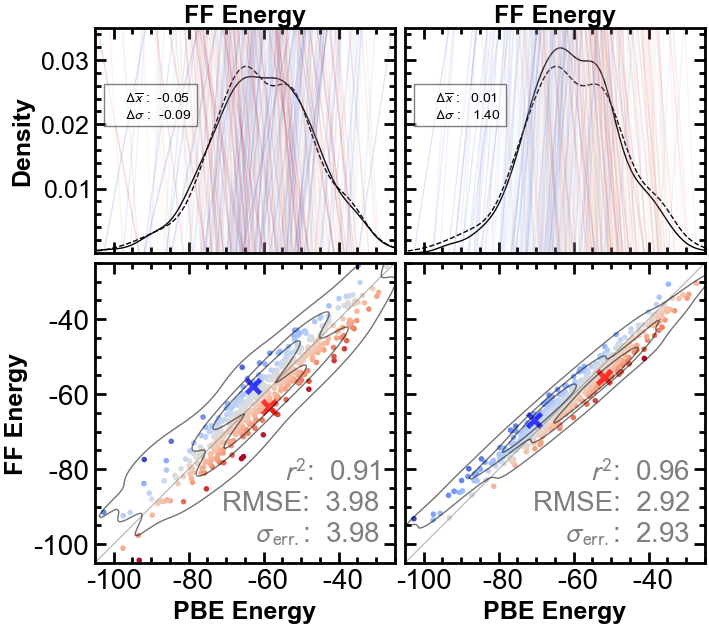

In [510]:
s1 = pw.stack([ci_lj, pollj_res, ], operator="/", margin=0.1)
s2 = pw.stack([m_de , m_res], operator="/", margin=0.1)

error_dist = pw.stack([s1 , s2], operator="|", margin=0.01)
error_dist.savefig("error_dists.pdf")

2023-10-24 12:01:23 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to load font
2023-10-24 12:01:23 | DEBUG | ttFont:_readTable:459 - Reading 'maxp' table from disk
2023-10-24 12:01:23 | DEBUG | ttFont:_readTable:468 - Decompiling 'maxp' table
2023-10-24 12:01:23 | DEBUG | loggingTools:__exit__:357 - Took 0.001s to load 'maxp'
2023-10-24 12:01:23 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'maxp'
2023-10-24 12:01:23 | INFO | __init__:_prune_pre_subset:3273 - maxp pruned
2023-10-24 12:01:23 | DEBUG | ttFont:_readTable:459 - Reading 'cmap' table from disk
2023-10-24 12:01:23 | DEBUG | ttFont:_readTable:468 - Decompiling 'cmap' table
2023-10-24 12:01:23 | DEBUG | ttFont:_readTable:459 - Reading 'post' table from disk
2023-10-24 12:01:23 | DEBUG | ttFont:_readTable:468 - Decompiling 'post' table
2023-10-24 12:01:23 | DEBUG | loggingTools:__exit__:357 - Took 0.003s to load 'cmap'
2023-10-24 12:01:23 | DEBUG | loggingTools:__exit__:357 - Took 0.000s to prune 'cmap'
2023-10-

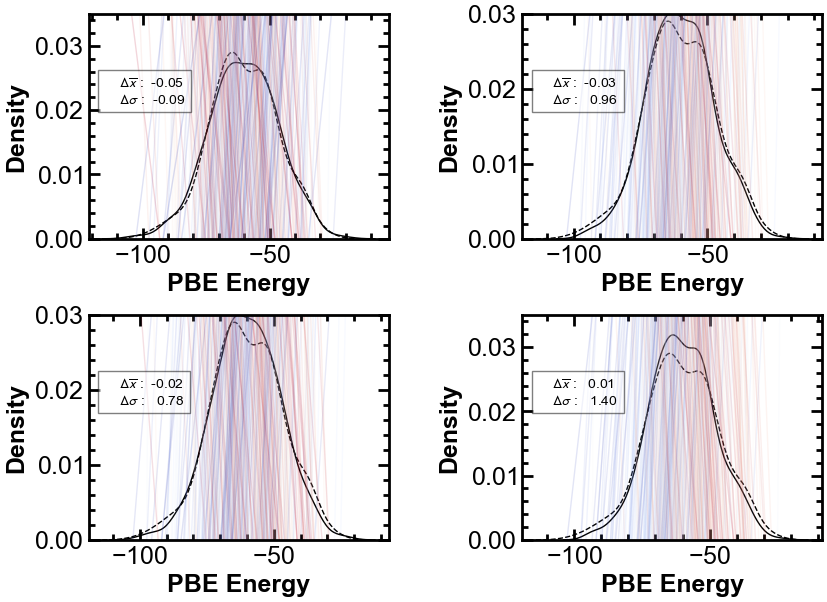

In [478]:
# dists_and_errors.savefig("dists_and_errors.pdf")

The introduction of an aniosotropic, QM-based electrostatic energy describing charge-penetration implies that the LJ term must now balance the remaining physics which contains components contributed to exchange and van der Waals interactions. Using an isotropic pair potential to balancing aniostropic energies is more difficult than the fully isotropic case, as averaged interactions benefit the most from fitting to the mean of the distribution, which is the result when performing least-squares optimizations on normally distributed data.


In [266]:
# residuals_plot(dataframes["ELECci_dcm_lj_elec.csv"], "")